# IMPORTING REQUIRED LIBRARIES

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style='darkgrid')
plt.style.use('bmh')
import datetime as dt

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
odf=pd.read_excel("uk electricity deman.xlsx",
                  sheet_name='historic_demand_2009_2024',parse_dates=[1],
                 )


In [4]:
odf.head()

,Unnamed: 0,settlement_date,settlement_period,nd,tsd,england_wales_demand,embedded_wind_generation,embedded_wind_capacity,embedded_solar_generation,embedded_solar_capacity,...,ifa2_flow,britned_flow,moyle_flow,east_west_flow,nemo_flow,nsl_flow,eleclink_flow,scottish_transfer,viking_flow,is_holiday
0,0,2009-01-01,1,37910,38704,33939,54,1403,0,0,...,0,0,-161,0,0,NaN,NaN,NaN,NaN,1
1,1,2009-01-01,2,38047,38964,34072,53,1403,0,0,...,0,0,-160,0,0,NaN,NaN,NaN,NaN,1
2,2,2009-01-01,3,37380,38651,33615,53,1403,0,0,...,0,0,-160,0,0,NaN,NaN,NaN,NaN,1
3,3,2009-01-01,4,36426,37775,32526,50,1403,0,0,...,0,0,-160,0,0,NaN,NaN,NaN,NaN,1
4,4,2009-01-01,5,35687,37298,31877,50,1403,0,0,...,0,0,-160,0,0,NaN,NaN,NaN,NaN,1


In [5]:
new_columns_name=['nd','tsd','ewd','em_wind_gen','em_wind_cap',
'em_solar_gen','em_solar_cap','non_balacing_mech_stor','pump_storage_pumping','is_holiday']
odf.isna().sum()

Unnamed: 0                        0
settlement_date                   0
settlement_period                 0
nd                                0
tsd                               0
england_wales_demand              0
embedded_wind_generation          0
embedded_wind_capacity            0
embedded_solar_generation         0
embedded_solar_capacity           0
non_bm_stor                       0
pump_storage_pumping              0
ifa_flow                          0
ifa2_flow                         0
britned_flow                      0
moyle_flow                        0
east_west_flow                    0
nemo_flow                         0
nsl_flow                     175296
eleclink_flow                175296
scottish_transfer            245424
viking_flow                  245424
is_holiday                        0
dtype: int64

In [6]:
odf.columns

Index(['Unnamed: 0', 'settlement_date', 'settlement_period', 'nd', 'tsd',
       'england_wales_demand', 'embedded_wind_generation',
       'embedded_wind_capacity', 'embedded_solar_generation',
       'embedded_solar_capacity', 'non_bm_stor', 'pump_storage_pumping',
       'ifa_flow', 'ifa2_flow', 'britned_flow', 'moyle_flow', 'east_west_flow',
       'nemo_flow', 'nsl_flow', 'eleclink_flow', 'scottish_transfer',
       'viking_flow', 'is_holiday'],
      dtype='object')

In [7]:
df = odf.groupby(['settlement_date'])[['nd', 'tsd', 'england_wales_demand', 'embedded_wind_generation', 'embedded_wind_capacity', 'embedded_solar_generation', 'embedded_solar_capacity', 'non_bm_stor', 'pump_storage_pumping', 'is_holiday']].mean()

df.columns=new_columns_name
df.asfreq('D')
df.head()

,nd,tsd,ewd,em_wind_gen,em_wind_cap,em_solar_gen,em_solar_cap,non_balacing_mech_stor,pump_storage_pumping,is_holiday
settlement_date,,,,,,,,,,
2009-01-01,37277.520833,38528.395833,33527.729167,65.666667,1403.0,0.0,0.0,0.000000,539.854167,1.0
2009-01-02,40015.020833,41133.458333,36087.083333,292.395833,1403.0,0.0,0.0,5.354167,391.500000,0.0
2009-01-03,39535.229167,40667.791667,35530.187500,185.375000,1403.0,0.0,0.0,3.145833,441.958333,0.0
2009-01-04,39820.979167,41013.958333,35889.770833,330.354167,1403.0,0.0,0.0,4.625000,474.104167,0.0
2009-01-05,45450.958333,47322.312500,41006.854167,508.916667,1403.0,0.0,0.0,10.125000,554.875000,0.0


In [8]:
df=df['2018-01-01':][['nd','tsd','ewd']]
df

,nd,tsd,ewd
settlement_date,,,
2018-01-01,29072.041667,30282.333333,26426.250000
2018-01-02,34863.416667,36009.041667,32155.645833
2018-01-03,34499.708333,35690.979167,31515.562500
2018-01-04,36414.145833,37628.979167,32892.625000
2018-01-05,36975.916667,38260.333333,33564.145833
...,...,...,...
2024-10-06,24747.395833,26680.291667,22626.333333
2024-10-07,26757.625000,28344.520833,24159.187500
2024-10-08,27500.083333,28906.375000,25465.750000


In [9]:
des=df.describe().T.reset_index()
des

,index,count,mean,std,min,25%,50%,75%,max
0,nd,2475.0,27669.750921,4487.158363,17560.187500,24176.114583,27193.041667,30906.197917,40297.229167
1,tsd,2475.0,29338.047849,4402.879881,19465.666667,26086.822917,28949.208333,32338.520833,42152.291667
2,ewd,2475.0,25302.996372,4121.366918,16450.625000,22050.406250,24841.895833,28343.916667,37573.791667


<Axes: title={'center': 'Electricity Demand'}, xlabel='settlement_date', ylabel='MW'>

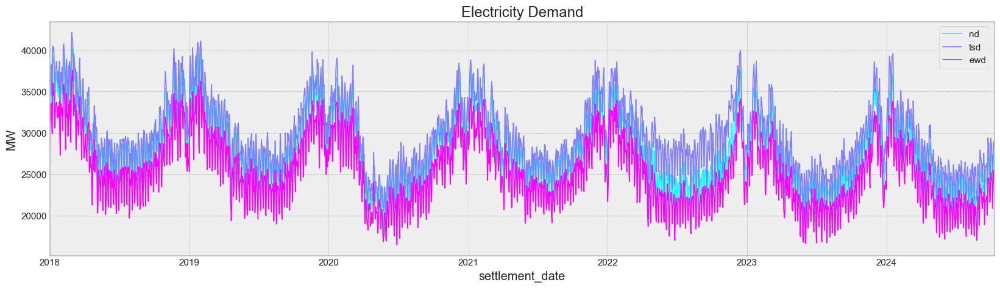

In [10]:
df.plot(figsize=(20,5),linewidth=1.2,cmap='cool',ylabel='MW',title='Electricity Demand')

# DATA PREPROCESSING

In [11]:
import tensorflow as tf
import keras
from tensorflow.keras.layers import Lambda, Dense, LSTM, SimpleRNN, Dropout,GRU,Bidirectional,LeakyReLU,BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import SGD,Adam,Adagrad
from tensorflow.keras.utils import plot_model
from tensorflow.keras.callbacks import LearningRateScheduler,EarlyStopping,ModelCheckpoint
from sklearn.preprocessing import MinMaxScaler as mms
from sklearn.model_selection import train_test_split as tts
from sklearn.metrics import mean_squared_error as mse
from sklearn.metrics import mean_absolute_error as mae
from sklearn.metrics import mean_absolute_percentage_error as mape
from tensorflow.keras.models import load_model

In [12]:
nd_data=df['nd'].values.reshape(-1,1)
tsd_data=df['tsd'].values.reshape(-1,1)
ewd_data=df['ewd'].values.reshape(-1,1)
print(nd_data.shape,tsd_data.shape,ewd_data.shape)

(2475, 1) (2475, 1) (2475, 1)


In [13]:
nd_sca=mms()
tsd_sca=mms()
ewd_sca=mms()

nd_scaler_ = nd_sca.fit_transform(nd_data)
tsd_scaler_ = tsd_sca.fit_transform(tsd_data)
ewd_scaler_ = ewd_sca.fit_transform(ewd_data)

In [14]:

def dataset(data,time_steps):
    x,y=[],[]
    for i in range(len(data)-time_steps):
        x.append(data[i:i+time_steps])
        y.append(data[i+time_steps])
    return np.array(x),np.array(y)

time_steps=12

In [15]:
x_nd,y_nd=dataset(nd_scaler_ ,time_steps)
x_tsd,y_tsd=dataset(tsd_scaler_,time_steps)
x_ewd,y_ewd=dataset(ewd_scaler_,time_steps)
x_ewd.shape,y_ewd.shape

((2463, 12, 1), (2463, 1))

In [16]:
xtrain_nd,xtest_nd,ytrain_nd,ytest_nd=tts(x_nd,y_nd,test_size=0.2,shuffle=False)
xtrain_tsd,xtest_tsd,ytrain_tsd,ytest_tsd=tts(x_tsd,y_tsd,test_size=0.2,shuffle=False)
xtrain_ewd,xtest_ewd,ytrain_ewd,ytest_ewd=tts(x_ewd,y_ewd,test_size=0.2,shuffle=False,)

In [17]:
xtrain_nd.shape

(1970, 12, 1)

In [18]:
num_features=3
xtrain_combined = np.concatenate((xtrain_nd, xtrain_tsd, xtrain_ewd), axis=2)
xtest_combined = np.concatenate((xtest_nd, xtest_tsd, xtest_ewd), axis=2)
xtest_combined.shape

(493, 12, 3)

In [19]:
def lr_(model,epoch):

    lr_sched=tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-9 * 10**(epoch/20))
    
    opt=tf.keras.optimizers.Adam()
    opt1=tf.keras.optimizers.SGD(momentum=0.9)
    opt2=tf.keras.optimizers.Adagrad()
    
    model.compile(optimizer=opt,loss=tf.keras.losses.Huber())
    
    history=model.fit(xtrain_combined,y=[ytrain_nd,ytrain_tsd,ytrain_ewd],shuffle=False,use_multiprocessing=True,
            batch_size=1,  epochs=epoch,callbacks=[lr_sched],steps_per_epoch=200)

    plt.figure(figsize=(20,6))
    plt.semilogx(history.history['lr'],history.history['loss'],linewidth=3,color='violet')
    plt.title('Optimal Learning Rate plot')
    plt.show()
    

In [20]:
def model_fits(model,model_name,_lr_rate,epoch):

    """
    OPTIMIZERS:
    
    * opt------> Adam
    * opt1-----> Stochastic Gradinet Descent
    * opt2-----> Adgrad
    * opt3-----> RMSprop
    
    """
    
    """
    CALLBACKS FOR BETTER MODEL BASED ON METRICS
    
    * e_s ----> Early Stopping
    * mc -----> Model Checkpoint
    
    """
    opt=tf.keras.optimizers.Adam(learning_rate=_lr_rate,epsilon=1e-4)
    opt1=tf.keras.optimizers.SGD(momentum=0.9,learning_rate=_lr_rate)
    opt2=tf.keras.optimizers.Adagrad(learning_rate=_lr_rate,epsilon=1e-4)
    opt3=tf.keras.optimizers.RMSprop( learning_rate=_lr_rate,rho=0.9,momentum=0.990,epsilon=1e-04,centered=True,)

    e_s=tf.keras.callbacks.EarlyStopping(monitor='mae',patience=7,verbose=1,
                                         restore_best_weights='True',min_delta=0.0001,start_from_epoch=70)
    
    f="savebestonlymodel.h5"
        
    mc=tf.keras.callbacks.ModelCheckpoint(filepath=f,monitor='mae',verbose=1,save_best_only=True)
   
    model.compile(optimizer=opt,loss=tf.keras.losses.Huber(),metrics=['mse','mae'])
    
    history=model.fit(xtrain_combined,y=[ytrain_nd,ytrain_tsd,ytrain_ewd],shuffle=False,use_multiprocessing=True,
            batch_size=1,  epochs=epoch,callbacks=[mc])#e_s 
    print('')
    print('')
    print(f"Model:{model_name}")
    print('')
    print('')
    
    

    
    fig=plt.figure(figsize=(30,10))
    plt.subplot(131)
    plt.plot(history.history['mse'],color='Orange')
    plt.xticks(fontsize='20')
    plt.yticks(fontsize='20')
    plt.title(f'{model_name} - MSE')
    plt.subplot(132)
    plt.plot(history.history['mae'],color='turquoise')
    plt.xticks(fontsize='20')
    plt.yticks(fontsize='20')
    plt.title(f'{model_name} - MAE')
    plt.subplot(133)
    plt.plot(history.history['loss'],color='purple')
    plt.xticks(fontsize='20')
    plt.yticks(fontsize='20')
    plt.title(f'{model_name} - Loss')
    
    
    # Save the model
    saved_model=model.save("savebestonlymodel.h5")
    
    return history,model

In [21]:
def predict_withplot(model,xtest,timestep=time_steps):
    
    # Prediction from the model for test set(in sample predictions)
    
    ypred=model.predict(xtest)
    ypred=np.array(ypred)
    
    

    
    if len(ypred.shape)==3:
        ypred=ypred.mean(axis=1)
    else:
        pass
    
    # Dataframe features
    
    dates=pd.date_range(start=df[len(xtrain_nd)+time_steps:].index.min(),end=df[len(xtrain_nd)+time_steps:].index.max(),freq='D')
    frame=pd.DataFrame(index=dates)
    
    
    # Extracting the respective values for the features and taking the inverse transformations from the minmaxscaler() and adding 
    # them for calculating the metrics performances of model.
    
    #National demand 
    nd_=ypred[:,0]
    nd_ypred=np.reshape(nd_,newshape=(-1,1))
    nd_ypred=nd_sca.inverse_transform(nd_ypred)
    
    nd_ytest=np.reshape(ytest_nd,newshape=(-1,1))
    nd_ytest=nd_sca.inverse_transform(nd_ytest)
    
    frame['nd_ypred']=nd_ypred
    frame['nd_ytest']=nd_ytest
   
     #Transmission system demand
    tsd_=ypred[:,1]
    tsd_ypred=np.reshape(tsd_,newshape=(-1,1))
    tsd_ypred=tsd_sca.inverse_transform(tsd_ypred)
    
    tsd_ytest=np.reshape(ytest_tsd,newshape=(-1,1))
    tsd_ytest=tsd_sca.inverse_transform(tsd_ytest)
    
    frame['tsd_ypred']=tsd_ypred
    frame['tsd_ytest']= tsd_ytest
    
    #England and wales deamand
    ewd_=ypred[:,2]
    ewd_ypred=np.reshape(ewd_,newshape=(-1,1))
    ewd_ypred=ewd_sca.inverse_transform(ewd_ypred)
    
    ewd_ytest=np.reshape(ytest_ewd,newshape=(-1,1))
    ewd_ytest=ewd_sca.inverse_transform(ewd_ytest)
    
    frame['ewd_ypred']=ewd_ypred
    frame['ewd_ytest']= ewd_ytest
    
    #plotting area-test vs predicted(in sample)
    
    fig,axs=plt.subplots(3,1,figsize=(30,20))

    frame[['nd_ypred', 'nd_ytest']].plot(ax=axs[0],color=['red','lime'])
    axs[0].set_title('National Demand',fontsize=40)
    axs[0].legend(fontsize='20')

    frame[['tsd_ytest','tsd_ypred']].plot(ax=axs[1],color=['lime','red'])
    axs[1].set_title('Transmission System Demand',fontsize=40)
    axs[1].legend(fontsize='20')

    frame[['ewd_ypred','ewd_ytest']].plot(ax=axs[2],color=['red','lime'])
    axs[2].set_title('England and Wales Demand',fontsize=40)
    axs[2].legend(fontsize='20')

    for ax in axs:
        ax.tick_params(axis='x', labelsize=15)  # Set x tick label size
        ax.tick_params(axis='y', labelsize=15)
        ax.set_ylabel('Electricity Demand in MV',fontsize='20')
    plt.tight_layout()
    plt.show()
    
    
    # Metrics dataframe
    
    met=pd.DataFrame()
    meansq=[]
    sqmeaner=[]
    mean_abs=[]
    mean_abs_p=[]
    for i,j in zip(('nd_ytest','tsd_ytest','ewd_ytest'),('nd_ypred','tsd_ypred','ewd_ypred')):
        meansq.append(mse(frame[i],frame[j]))
        sqmeaner.append(np.sqrt(mse(frame[i],frame[j])))
        mean_abs.append(mae(frame[i],frame[j]))
        mean_abs_p.append(mape(frame[i],frame[j]))
    met['Mean Squared Error']=meansq
    met['Squared Root (mse)']=sqmeaner
    met['Mean Absolute Error']=mean_abs
    met['Mean Absolute Percentage Error']=mean_abs_p
    l=['National Demand','Transmission System Demand','England and Wales Demand']
    met.index=l
    met=met.T.round()
    met
    
    return frame,met

In [22]:

def forecasts(model,dayss=1):


    last_batch = xtest_combined[-1]
    future = []
    for i in range(dayss):
        last_batch=np.reshape(last_batch,newshape=(-1,xtest_combined.shape[1],xtest_combined.shape[2]))
        prediction=model.predict(last_batch)
        future.append(prediction)
        
        if len(prediction.shape)==3:  #   return_sequence = True
    
            last_batch=np.concatenate((last_batch[1:],prediction),axis=0)
            
        else:                         #   return_sequence = False
    
            last_batch=np.reshape(last_batch,(last_batch.shape[1],last_batch.shape[2]))
            last_batch=np.concatenate((last_batch[1:],prediction),axis=0)
        
    future=np.array(future)
    
    if len(future.shape)== 4:         #    return_sequence=True
        
        print('Before:',future.shape)
        future=future.squeeze(axis=1).mean(axis=1)
        print('After Squeeze and mean:',future.shape)
       
    else:                            #   return_sequence=False
        
        print('Before:',future.shape)
        future=future.mean(axis=1)
        print('After mean:',future.shape)
       
    #Extracting the national demand values and taking inverse transformation from the minmaxscaler
    
    national=future[:,0]
    national=np.reshape(national,(-1,1))
    national=nd_sca.inverse_transform(national)
    
    # transmission system demand
    
    transmission=future[:,1]
    transmission=np.reshape(transmission,(-1,1))
    transmission=tsd_sca.inverse_transform(transmission)
    
    # England and wales demand.
    
    england=future[:,2]
    england=np.reshape(england,(-1,1))
    england=ewd_sca.inverse_transform(england)
    
    #dataframe 
    
    start_date='1-1-2024'
    start_date=pd.to_datetime(start_date,infer_datetime_format=True)
    end_date=start_date+pd.Timedelta(days=dayss-1)
    dates_list=pd.date_range(start=start_date,end=end_date)
    
    forecast=pd.DataFrame()
    forecast['date']=dates_list
    forecast.set_index('date',inplace=True)
    forecast['nd_2024']=national
    forecast['tsd_2024']=transmission
    forecast['ewd_2024']=england
        
        
    return forecast

In [23]:
def f_2024(data):
    
    """ Plotting the out-of-sample predictions for year 2024(electricity demand of UK) """
    
    fig, axs = plt.subplots(3, 1, figsize=(30,20))
    cols=['nd_2024','tsd_2024','ewd_2024']
    cols1=['National Demand','Transmission System Demand','England and wales Demand']
    for i, ax ,j,k in zip(cols, axs,['darkorange','aqua','fuchsia'],cols1):
        data[i].plot(linewidth=2,c=j, ax=ax,marker='^')
        ax.set_title(f"Electricity Forecast 2024 - {k}",fontsize=50,fontweight='bold')
        ax.set_ylabel('Electricity in MW')
        ax.tick_params(axis='x', labelsize=15)  # Set x tick label size
        ax.tick_params(axis='y', labelsize=15)
           
    plt.tight_layout()
    plt.show()


# SIMPLE RNN MODEL

In [24]:
from tensorflow.keras.layers import LeakyReLU

m = Sequential([
    SimpleRNN(units=200, activation='tanh', return_sequences=True,
              input_shape=(xtrain_combined.shape[1], xtrain_combined.shape[2]), name='R11'),
    SimpleRNN(units=200, activation='tanh', name='R12'),
    Dense(units=125, name='Den1'),
    LeakyReLU(),  # Added as a separate layer
    Dense(units=3, activation='linear', name=f'Final_layer_with_{num_features}_output')
])

print(m.summary())


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ R11 (SimpleRNN)                 │ (None, 12, 200)        │        40,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ R12 (SimpleRNN)                 │ (None, 200)            │        80,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Den1 (Dense)                    │ (None, 125)            │        25,125 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 125)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Final_layer_with_3_output       │ (None, 3)              │           378 │
│ (Dense)                         │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 146,503 (572.28 KB)

 Trainable params: 146,503 (572.28 KB)

 Non-trainable params: 0 (0.00 B)

None


In [25]:
import tensorflow as tf
from tensorflow.keras.layers import SimpleRNN, Dense, LeakyReLU
from tensorflow.keras.models import Sequential

# Define the model
m = Sequential([
    SimpleRNN(units=200, activation='tanh', return_sequences=True,
              input_shape=(xtrain_combined.shape[1], xtrain_combined.shape[2]), name='R11'),
    SimpleRNN(units=200, activation='tanh', name='R12'),
    Dense(units=125, name='Den1'),
    LeakyReLU(),  # Added LeakyReLU as a separate layer
    Dense(units=3, activation='linear', name=f'Final_layer_with_{num_features}_output')
])

# Compile the model
opt = tf.keras.optimizers.Adagrad()
m.compile(optimizer=opt, loss=tf.keras.losses.Huber(), metrics=['mae'])

# Define callbacks
lr_sched = tf.keras.callbacks.LearningRateScheduler(lambda epoch: 1e-6 * 300)
mc = tf.keras.callbacks.ModelCheckpoint(filepath="savebestonlymodel.keras", monitor='mae', save_best_only=True)

# Fit the model
history = m.fit(
    xtrain_combined, y=[ytrain_nd, ytrain_tsd, ytrain_ewd], 
    shuffle=False, batch_size=12, epochs=50, callbacks=[lr_sched, mc], steps_per_epoch=200
)




Epoch 1/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step - loss: 0.0196 - mae: 0.1507 - learning_rate: 3.0000e-04
Epoch 2/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0125 - mae: 0.1245 - learning_rate: 3.0000e-04
Epoch 3/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0097 - mae: 0.1100 - learning_rate: 3.0000e-04
Epoch 4/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0083 - mae: 0.1018 - learning_rate: 3.0000e-04
Epoch 5/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0074 - mae: 0.0965 - learning_rate: 3.0000e-04
Epoch 6/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0069 - mae: 0.0927 - learning_rate: 3.0000e-04
Epoch 7/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0065 - mae: 0.0900 - learning_rate: 3.0000e-04
Epoch 8/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0062 - mae: 0.0880 - learning_rate: 3.0000e-04
Epoch 9/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0060 - mae: 0.0864 - learning_rate: 3.0000e-04
Epoch 10/50
200/200

* optimal learning rate based on the model will be less than 1e-6.

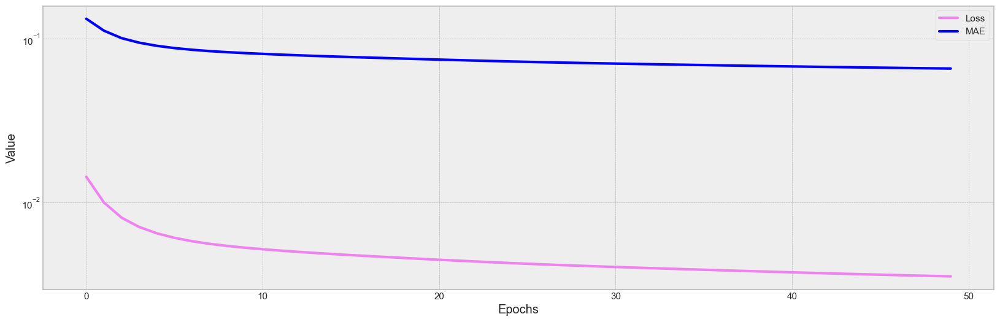

In [26]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))
plt.semilogy(history.history['loss'], linewidth=3, color='violet', label='Loss')
plt.semilogy(history.history['mae'], linewidth=3, color='blue', label='MAE')
plt.xlabel('Epochs')
plt.ylabel('Value')
plt.legend()
plt.show()


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


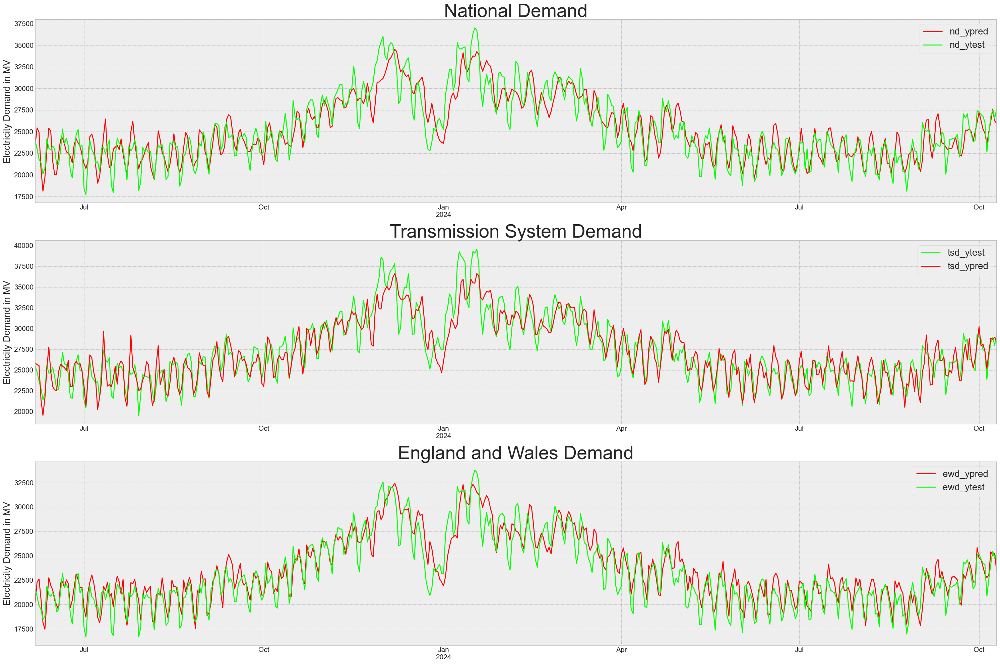

In [27]:
c, mt = predict_withplot(m, xtest_combined)


In [28]:
mt

,National Demand,Transmission System Demand,England and Wales Demand
Mean Squared Error,3283714.0,3102418.0,2395762.0
Squared Root (mse),1812.0,1761.0,1548.0
Mean Absolute Error,1429.0,1375.0,1210.0
Mean Absolute Percentage Error,0.0,0.0,0.0


In [29]:
rnnforecast = forecasts(m, 366)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━

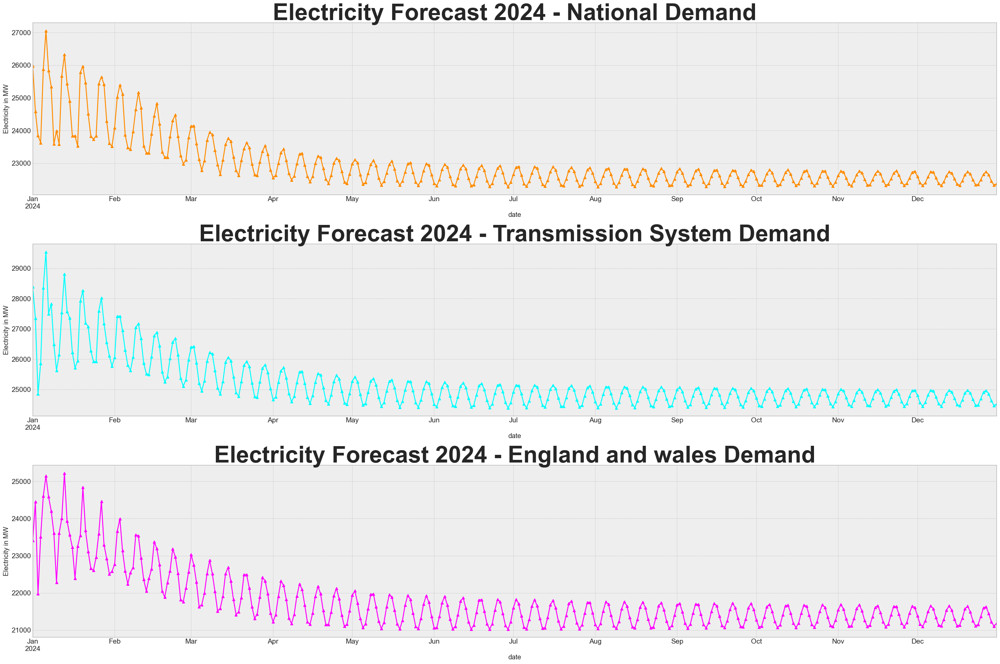

In [30]:
f_2024(rnnforecast)

# BI-DIRECTIONAL RNN MODEL


In [31]:
from tensorflow.keras.layers import Bidirectional, SimpleRNN, Dense, LeakyReLU
from tensorflow.keras.models import Sequential

# Define the model
bm = Sequential([
    Bidirectional(SimpleRNN(units=300, return_sequences=True,
                            input_shape=(xtrain_combined.shape[1], xtrain_combined.shape[2]), name='BR11')),
    Bidirectional(SimpleRNN(units=200, return_sequences=True, name='R12')),
    Bidirectional(SimpleRNN(units=100, return_sequences=True, name='R13')),
    Bidirectional(SimpleRNN(units=45, return_sequences=False, name='R14')),
    Dense(units=45, name='Dense1'),
    LeakyReLU(),  # Added LeakyReLU as a separate layer
    Dense(units=10, name='Dense2'),
    LeakyReLU(),  # Added LeakyReLU as a separate layer
    Dense(units=3, activation='linear', name=f'Final_layer_with_{num_features}_output')
])

# Summary of the model
bm.summary()


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional (Bidirectional)   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_2 (Bidirectional) │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_3 (Bidirectional) │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense1 (Dense)                  │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense2 (Dense)                  │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Final_layer_with_3_output       │ ?                      │   0 (unbuilt) │
│ (Dense)                         │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [32]:
print(bm.summary()) 

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional (Bidirectional)   │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_1 (Bidirectional) │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_2 (Bidirectional) │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_3 (Bidirectional) │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense1 (Dense)                  │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Dense2 (Dense)                  │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Final_layer_with_3_output       │ ?                      │   0 (unbuilt) │
│ (Dense)                         │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

None


Epoch 1/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 9s 16ms/step - loss: 0.0248 - learning_rate: 3.0000e-04
Epoch 2/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.0091 - learning_rate: 3.0000e-04
Epoch 3/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0064 - learning_rate: 3.0000e-04
Epoch 4/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0053 - learning_rate: 3.0000e-04
Epoch 5/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0047 - learning_rate: 3.0000e-04
Epoch 6/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 0.0043 - learning_rate: 3.0000e-04
Epoch 7/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 0.0040 - learning_rate: 3.0000e-04
Epoch 8/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 0.0038 - learning_rate: 3.0000e-04
Epoch 9/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 0.0036 - learning_rate: 3.0000e-04
Epoch 10/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 0.0035 - learning_rate: 3.0000e-04
Epoch 11/50
200/200 ━━━━━━━━━━━━━━━━━━━

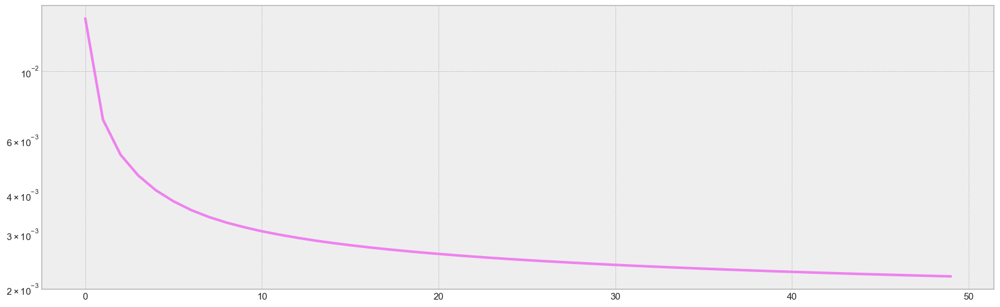

In [33]:
# Compile the model
opt2 = tf.keras.optimizers.Adagrad()
bm.compile(optimizer=opt2, loss=tf.keras.losses.Huber())

# Fit the model
history = bm.fit(
    xtrain_combined, y=[ytrain_nd, ytrain_tsd, ytrain_ewd],
    shuffle=False, batch_size=12, epochs=50, callbacks=[lr_sched], steps_per_epoch=200
)

# Plotting the training history
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))
plt.semilogy(history.history['loss'], linewidth=3, color='violet')
plt.show()


* optimal learning rate based on the model will be less than 1e-7.

16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step


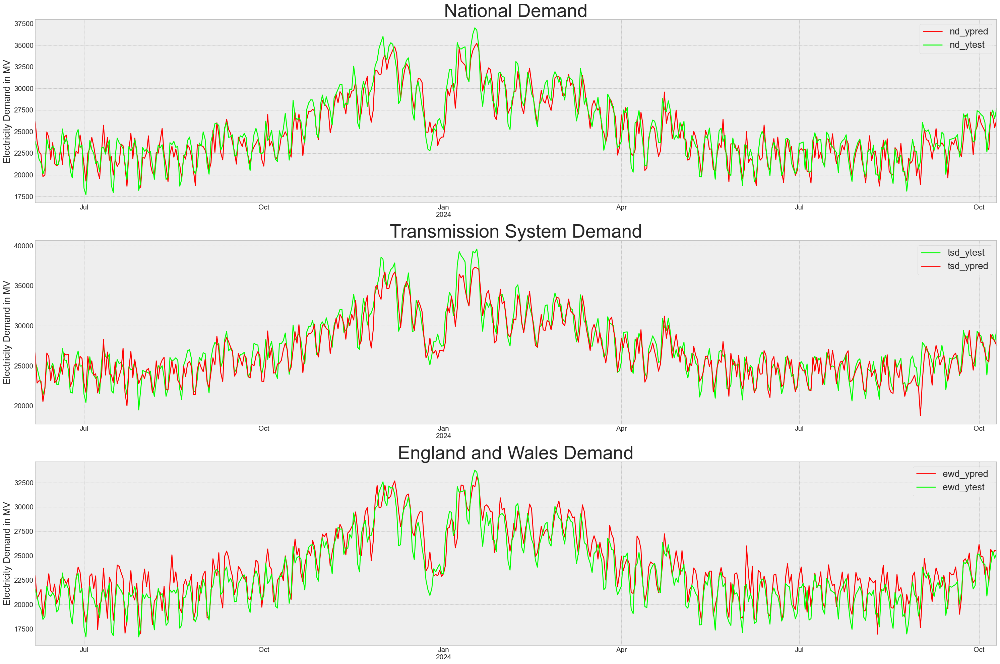

In [34]:
brnnframe, brnn_metrics = predict_withplot(bm, xtest_combined)


In [35]:
brnn_metrics

,National Demand,Transmission System Demand,England and Wales Demand
Mean Squared Error,2160108.0,2360979.0,2446306.0
Squared Root (mse),1470.0,1537.0,1564.0
Mean Absolute Error,1168.0,1214.0,1250.0
Mean Absolute Percentage Error,0.0,0.0,0.0


In [36]:
brnnforecast = forecasts(bm, 366)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━

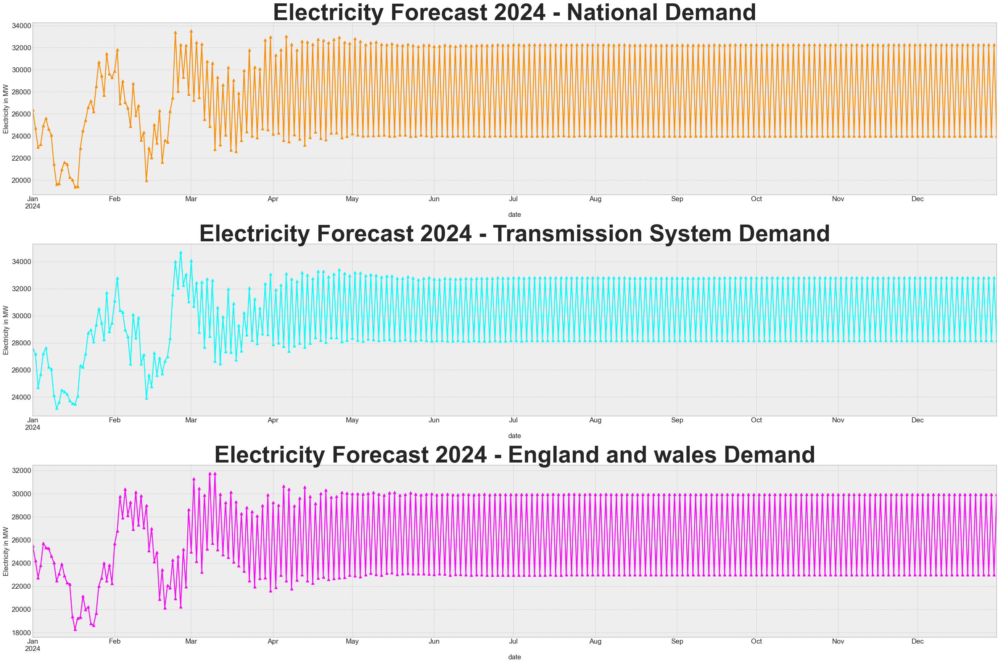

In [37]:
bm.save('bidirectionalrnn_model.keras')


f_2024(brnnforecast)


# LSTM

In [38]:
ls = Sequential([
    LSTM(units=80, return_sequences=True, activation='relu', 
         input_shape=(xtrain_combined.shape[1], xtrain_combined.shape[2]), name='lstm1'),
    
    LSTM(units=60, return_sequences=True, name='lstm2', activation='relu'),
    
    LSTM(units=60, return_sequences=True, name='lstm3', activation='relu'),
    
    LSTM(units=60, return_sequences=True, name='lstm4', activation='relu'),
    
    LSTM(units=60, return_sequences=False, name='lstm5', activation='relu'),
  
    Dense(units=184, activation='relu'),
    
    Dense(units=162, activation='relu'),
    
    Dense(units=127, activation='relu'),
    
    Dense(units=56, activation='relu',),
    
    Dense(units=36, activation='relu'),
    
    Dense(units=27, activation='relu'), 
    
    Dense(units=9, activation='relu'), 
    
    Dense(units=6, activation='relu'),
    
    Dense(units=num_features, activation='linear', name=f'Final_layer_with_{num_features}_output')
])


Epoch 1/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - loss: 0.0024 - learning_rate: 3.0000e-04
Epoch 2/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0024 - learning_rate: 3.0000e-04
Epoch 3/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0024 - learning_rate: 3.0000e-04
Epoch 4/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0024 - learning_rate: 3.0000e-04
Epoch 5/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0024 - learning_rate: 3.0000e-04
Epoch 6/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0024 - learning_rate: 3.0000e-04
Epoch 7/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 0.0023 - learning_rate: 3.0000e-04
Epoch 8/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0023 - learning_rate: 3.0000e-04
Epoch 9/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 0.0023 - learning_rate: 3.0000e-04
Epoch 10/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 0.0023 - learning_rate: 3.0000e-04
Epoch 11/50
200/200 ━━━━━━━━━━━━━━━━━━━

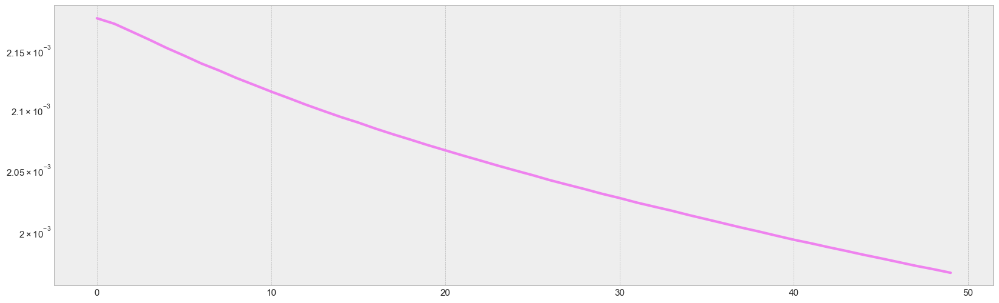

In [39]:
# Compile the model
opt2 = tf.keras.optimizers.Adagrad()
bm.compile(optimizer=opt2, loss=tf.keras.losses.Huber())

# Fit the model (set epochs to an integer)
history = bm.fit(
    xtrain_combined, y=[ytrain_nd, ytrain_tsd, ytrain_ewd],
    shuffle=False, batch_size=12, epochs=50, callbacks=[lr_sched], steps_per_epoch=200
)

# Plotting the training history
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))
plt.semilogy(history.history['loss'], linewidth=3, color='violet')
plt.show()


* optimal learning rate based on the model will be less than 1e-4.

In [40]:
# ModelCheckpoint correction
mc = tf.keras.callbacks.ModelCheckpoint(filepath="savebestonlymodel.keras", monitor='mae', verbose=1, save_best_only=True)


16/16 ━━━━━━━━━━━━━━━━━━━━ 2s 85ms/step


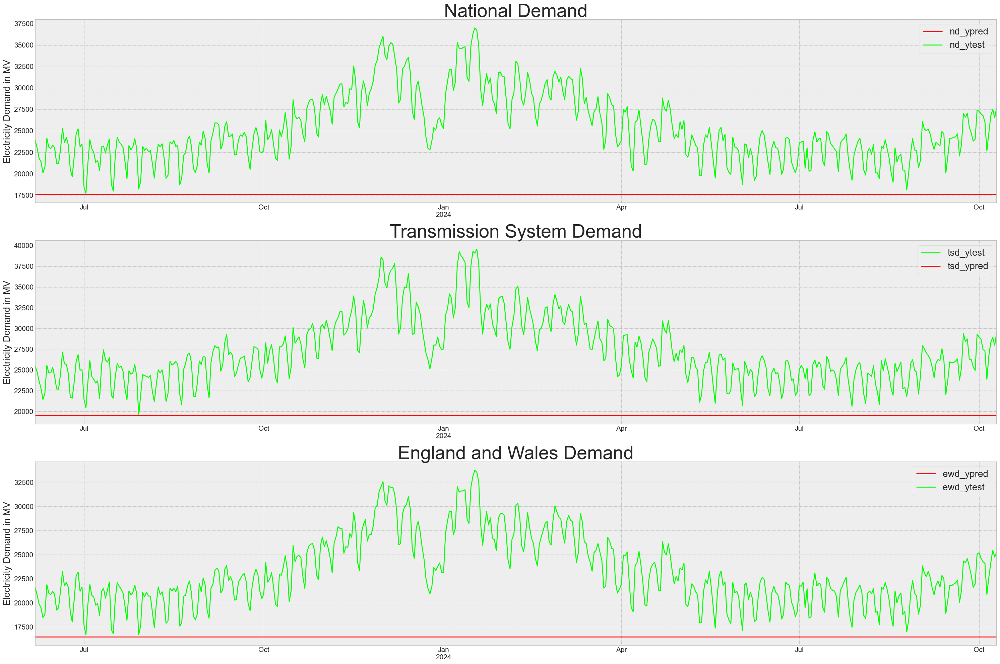

In [41]:
lstm_model = tf.keras.models.load_model("savebestonlymodel.keras")

lsframe,ls_metrics=predict_withplot(ls,xtest_combined) 

In [42]:
ls_metrics

,National Demand,Transmission System Demand,England and Wales Demand
Mean Squared Error,74780278.0,76010669.0,58324142.0
Squared Root (mse),8648.0,8718.0,7637.0
Mean Absolute Error,7719.0,7794.0,6747.0
Mean Absolute Percentage Error,0.0,0.0,0.0


In [43]:
lstmforecast=forecasts(ls,366)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━

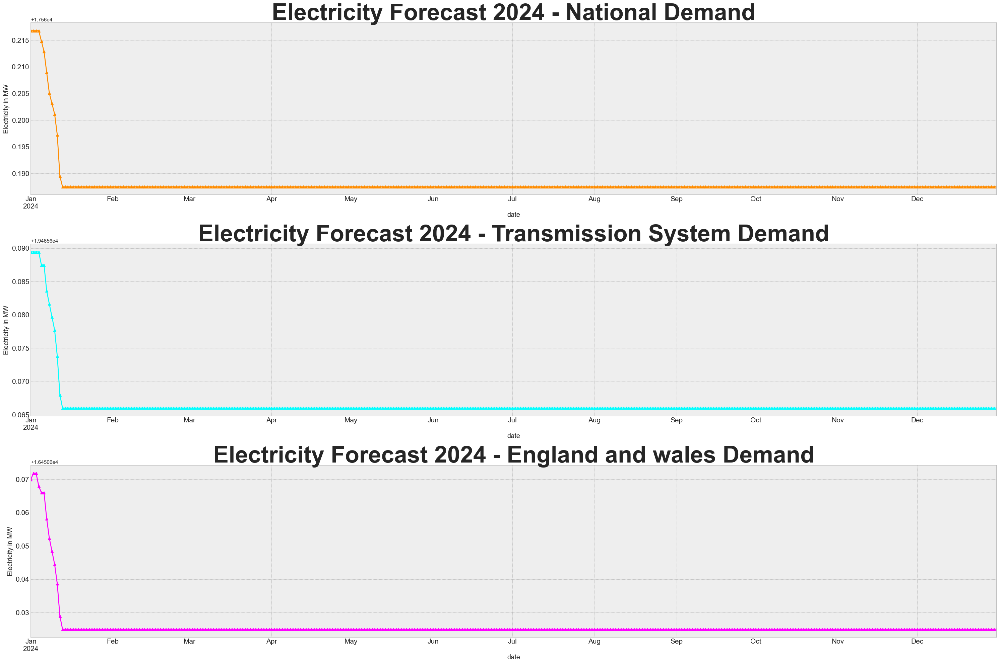

In [44]:
f_2024(lstmforecast)

# BIDIRECTIONAL LSTM

In [45]:
bils = Sequential([
    Bidirectional(LSTM(units=100, return_sequences=True, activation='relu', 
         input_shape=(xtrain_combined.shape[1], xtrain_combined.shape[2]), name='lstm1')),
  
    Bidirectional(LSTM(units=100, return_sequences=True, name='lstm2', activation='relu')),
    
    Bidirectional(LSTM(units=100, return_sequences=True, name='lstm3', activation='relu')),
    
    Bidirectional(LSTM(units=60, return_sequences=True, name='lstm4', activation='relu')),
    
    Bidirectional(LSTM(units=60, return_sequences=False, name='lstm5', activation='relu')),
  
    Dense(units=184, activation='relu'),
    
    Dense(units=162, activation='relu'),
    
    Dense(units=127, activation='relu'),
    
    Dense(units=56, activation='relu',),
    
    Dense(units=36, activation='relu'),
    
    Dense(units=27, activation='relu'), 
    
    Dense(units=9, activation='relu'), 
    
    Dense(units=6, activation='relu'),
    
    Dense(units=num_features, activation='linear', name=f'Final_layer_with_{num_features}_output')
])

Epoch 1/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 11s 16ms/step - loss: 0.0028 - learning_rate: 3.0000e-04
Epoch 2/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0020 - learning_rate: 3.0000e-04
Epoch 3/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0022 - learning_rate: 3.0000e-04
Epoch 4/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0017 - learning_rate: 3.0000e-04
Epoch 5/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0022 - learning_rate: 3.0000e-04
Epoch 6/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0019 - learning_rate: 3.0000e-04
Epoch 7/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 9.4817e-04 - learning_rate: 3.0000e-04
Epoch 8/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0027 - learning_rate: 3.0000e-04
Epoch 9/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 0.0015 - learning_rate: 3.0000e-04
Epoch 10/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0027 - learning_rate: 3.0000e-04
Epoch 11/50
200/200 ━━━━━━━━━━━━━━

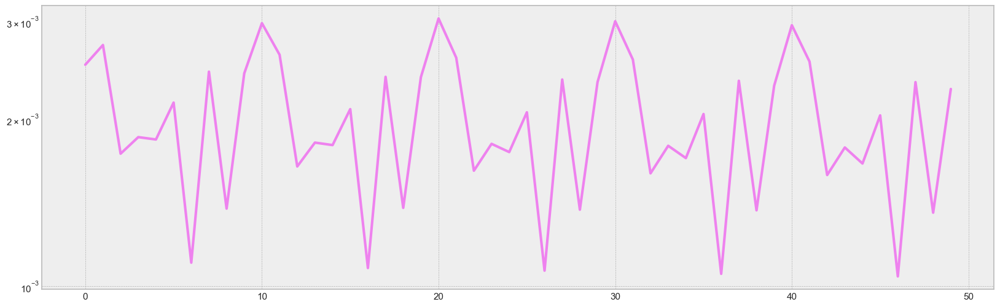

In [46]:
# Compile the model
opt2 = tf.keras.optimizers.Adagrad()
bm.compile(optimizer=opt2, loss=tf.keras.losses.Huber())

# Fit the model (remove use_multiprocessing)
history = bm.fit(
    xtrain_combined, y=[ytrain_nd, ytrain_tsd, ytrain_ewd],
    shuffle=False, batch_size=1, epochs=50, callbacks=[lr_sched], steps_per_epoch=200
)

# Plotting the training history
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))
plt.semilogy(history.history['loss'], linewidth=3, color='violet')
plt.show()


* optimal learning rate based on the model will be less than 1e-4.

16/16 ━━━━━━━━━━━━━━━━━━━━ 1s 22ms/step


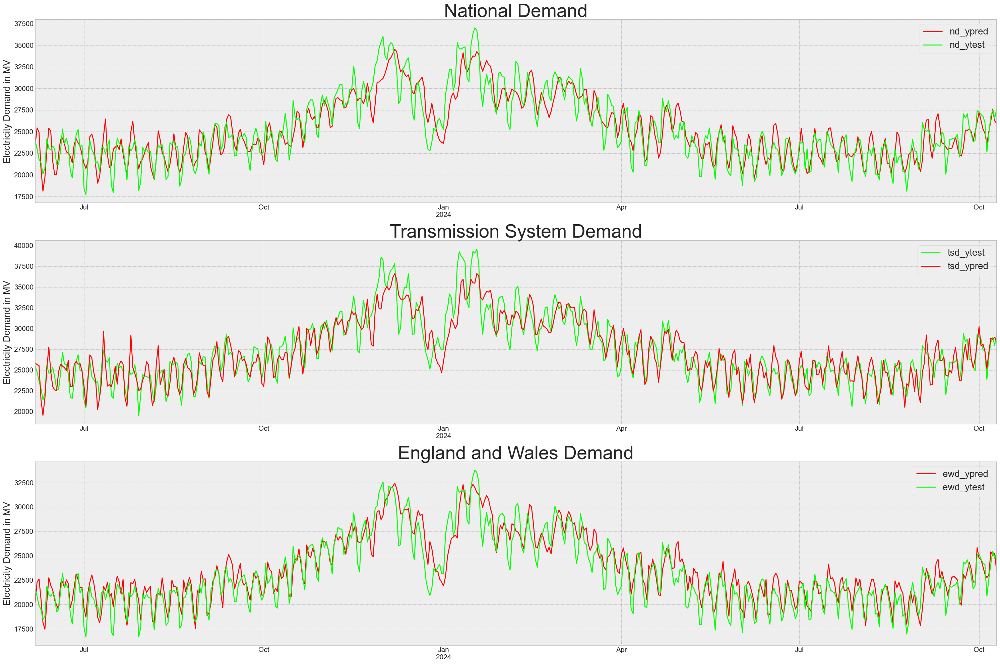

In [47]:
bils = tf.keras.models.load_model("savebestonlymodel.keras")
bilsframe, bils_metrics = predict_withplot(bils, xtest_combined)


In [48]:
bils_metrics

,National Demand,Transmission System Demand,England and Wales Demand
Mean Squared Error,3283714.0,3102418.0,2395762.0
Squared Root (mse),1812.0,1761.0,1548.0
Mean Absolute Error,1429.0,1375.0,1210.0
Mean Absolute Percentage Error,0.0,0.0,0.0


In [ ]:
bilstmforecast=forecasts(bils,366)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 15ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━

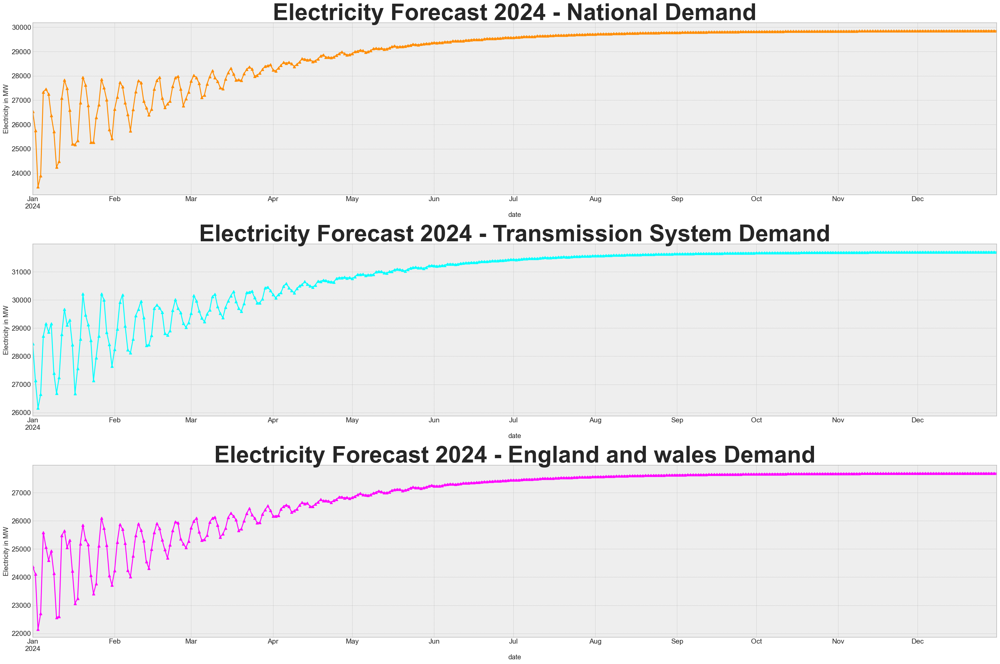

In [ ]:
f_2024(bilstmforecast)

# GRU MODEL

In [ ]:
from tensorflow.keras.layers import GRU, Dense, LeakyReLU
from tensorflow.keras.models import Sequential

# Define the GRU model
grum = Sequential([
    GRU(units=100, activation='tanh', return_sequences=True,
        input_shape=(xtrain_combined.shape[1], xtrain_combined.shape[2]), name='gru1'),
    GRU(units=100, activation='tanh', return_sequences=True, name='gru2'),
    Dense(units=50, name='dense1'),
    LeakyReLU(),  # Add LeakyReLU as a separate layer
    Dense(units=25, name='dense2'),
    LeakyReLU(),  # Add LeakyReLU as a separate layer
    Dense(units=9, name='dense3'),
    LeakyReLU(),  # Add LeakyReLU as a separate layer
    Dense(units=num_features, activation='linear', name=f'Final_layer_with_{num_features}_output')
])

# Print the summary of the model
grum.summary()


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ gru1 (GRU)                      │ (None, 12, 100)        │        31,500 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gru2 (GRU)                      │ (None, 12, 100)        │        60,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense1 (Dense)                  │ (None, 12, 50)         │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 12, 50)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense2 (Dense)                  │ (None, 12, 25)         │         1,275 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 12, 25)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense3 (Dense)                  │ (None, 12, 9)          │           234 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 12, 9)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Final_layer_with_3_output       │ (None, 12, 3)          │            30 │
│ (Dense)                         │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 98,689 (385.50 KB)

 Trainable params: 98,689 (385.50 KB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 0.2379 - learning_rate: 3.0000e-04
Epoch 2/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0838 - learning_rate: 3.0000e-04
Epoch 3/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0813 - learning_rate: 3.0000e-04
Epoch 4/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0777 - learning_rate: 3.0000e-04
Epoch 5/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0105 - learning_rate: 3.0000e-04
Epoch 6/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0693 - learning_rate: 3.0000e-04
Epoch 7/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0164 - learning_rate: 3.0000e-04
Epoch 8/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0617 - learning_rate: 3.0000e-04
Epoch 9/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - loss: 0.0060 - learning_rate: 3.0000e-04
Epoch 10/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0287 - learning_rate: 3.0000e-04
Epoch 11/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/s

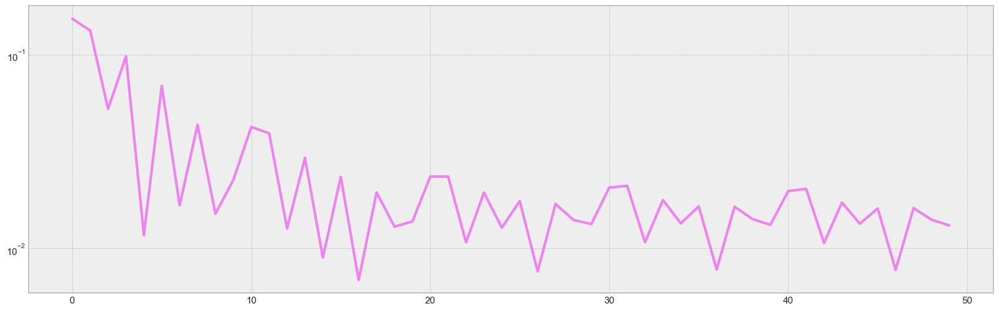

In [ ]:
# Compile the model
opt2 = tf.keras.optimizers.Adagrad()
grum.compile(optimizer=opt2, loss=tf.keras.losses.Huber())

# Fit the model (remove use_multiprocessing)
history = grum.fit(
    xtrain_combined, y=[ytrain_nd, ytrain_tsd, ytrain_ewd],
    shuffle=False, batch_size=1, epochs=50, callbacks=[lr_sched], steps_per_epoch=200
)

# Plotting the training history
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))
plt.semilogy(history.history['loss'], linewidth=3, color='violet')
plt.show()


* optimal learning rate based on the model will be less than 1e-4.

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


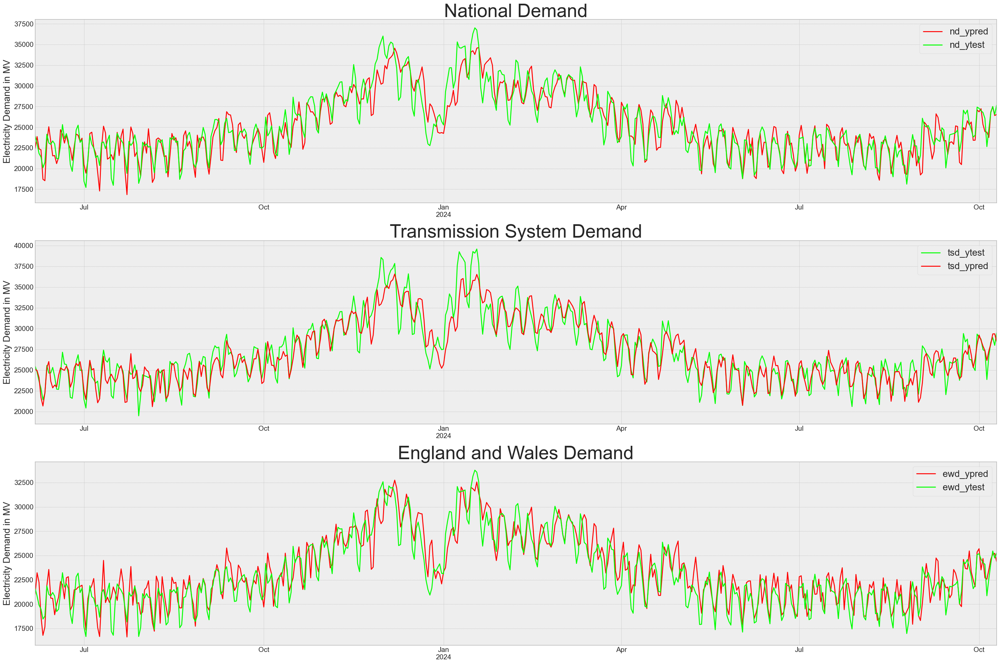

In [ ]:
gru = tf.keras.models.load_model("savebestonlymodel.keras")

gruframe, gru_metrics = predict_withplot(gru, xtest_combined)


In [ ]:
gru_metrics

,National Demand,Transmission System Demand,England and Wales Demand
Mean Squared Error,3034133.0,2656393.0,2600271.0
Squared Root (mse),1742.0,1630.0,1613.0
Mean Absolute Error,1345.0,1243.0,1262.0
Mean Absolute Percentage Error,0.0,0.0,0.0


In [ ]:
gruforecast=forecasts(gru,366)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━

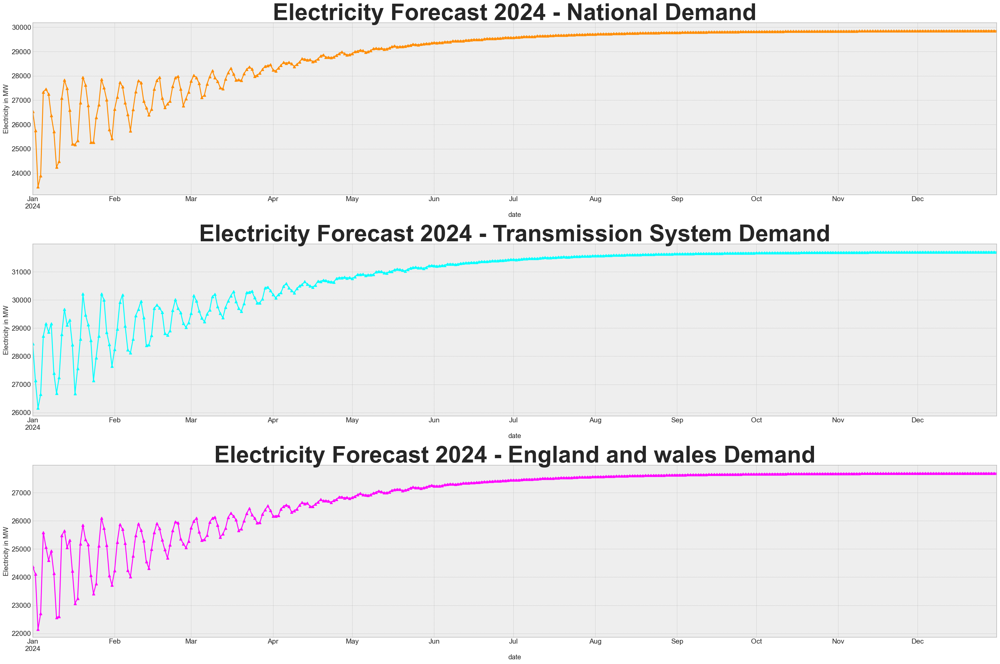

In [ ]:
f_2024(gruforecast)

# BIDIRECTIONAL GRU

In [ ]:
from tensorflow.keras.layers import GRU, Dense, LeakyReLU, Bidirectional
from tensorflow.keras.models import Sequential

# Define the model
bigrum = Sequential([
    Bidirectional(GRU(units=100, activation='tanh', return_sequences=True, 
                      input_shape=(xtrain_combined.shape[1], xtrain_combined.shape[2]), name='gru1')),
    Bidirectional(GRU(units=100, activation='tanh', return_sequences=True, name='gru2')),
    Bidirectional(GRU(units=100, activation='tanh', return_sequences=True, name='gru3')),
    Dense(units=50, name='dense1'),
    LeakyReLU(),  # Add LeakyReLU as a separate layer
    Dense(units=25, name='dense2'),
    LeakyReLU(),  # Add LeakyReLU as a separate layer
    Dense(units=9, name='dense3'),
    LeakyReLU(),  # Add LeakyReLU as a separate layer
    Dense(units=num_features, activation='linear', name=f'Final_layer_with_{num_features}_output')
])

# Print model summary
bigrum.summary()


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ bidirectional_16                │ ?                      │   0 (unbuilt) │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_17                │ ?                      │   0 (unbuilt) │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_18                │ ?                      │   0 (unbuilt) │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense1 (Dense)                  │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense2 (Dense)                  │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_9 (LeakyReLU)       │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense3 (Dense)                  │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_10 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Final_layer_with_3_output       │ ?                      │   0 (unbuilt) │
│ (Dense)                         │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50


200/200 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - loss: 0.0736 - learning_rate: 3.0000e-04
Epoch 2/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0074 - learning_rate: 3.0000e-04
Epoch 3/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0069 - learning_rate: 3.0000e-04
Epoch 4/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0055 - learning_rate: 3.0000e-04
Epoch 5/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 0.0042 - learning_rate: 3.0000e-04
Epoch 6/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 0.0070 - learning_rate: 3.0000e-04
Epoch 7/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.0031 - learning_rate: 3.0000e-04
Epoch 8/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 0.0088 - learning_rate: 3.0000e-04
Epoch 9/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - loss: 0.0040 - learning_rate: 3.0000e-04
Epoch 10/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0145 - learning_rate: 3.0000e-04
Epoch 11/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step 

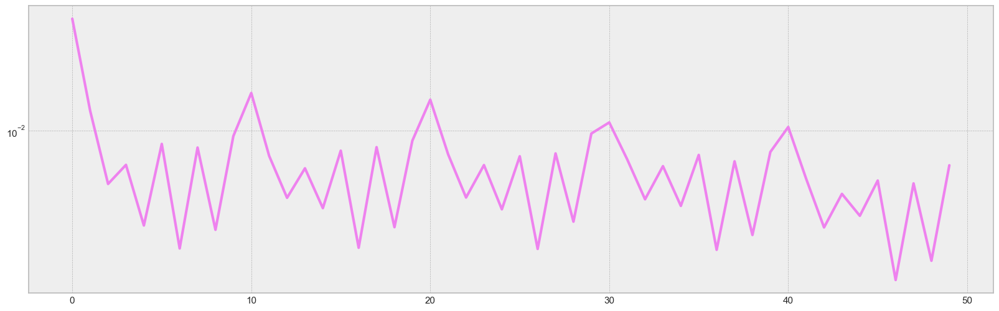

In [ ]:
# Define the number of epochs
epoch = 50  # Adjust this value as needed

# Fit the model (remove use_multiprocessing)
history = bigrum.fit(
    xtrain_combined, y=[ytrain_nd, ytrain_tsd, ytrain_ewd],
    shuffle=False, batch_size=1, epochs=epoch, callbacks=[lr_sched], steps_per_epoch=200
)

# Plotting the training history
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))
plt.semilogy(history.history['loss'], linewidth=3, color='violet')
plt.show()


* optimal learning rate based on the model will be less than 1e-3.

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


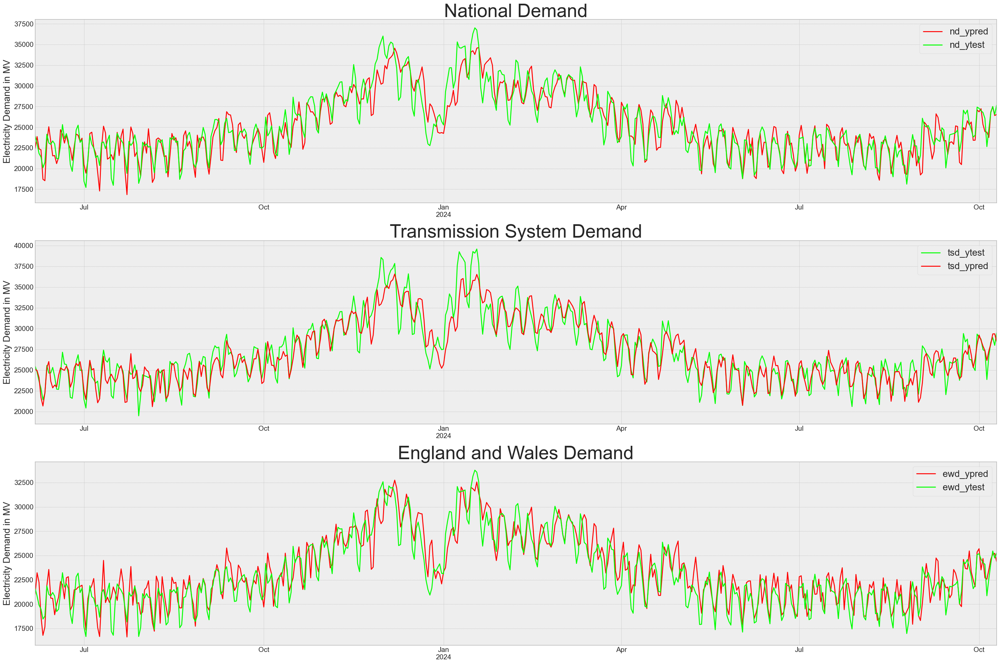

In [ ]:
bigru = tf.keras.models.load_model("savebestonlymodel.keras")

bigruframe,bigru_metrics=predict_withplot(bigru,xtest_combined) #

In [ ]:
bigru_metrics#

,National Demand,Transmission System Demand,England and Wales Demand
Mean Squared Error,3034133.0,2656393.0,2600271.0
Squared Root (mse),1742.0,1630.0,1613.0
Mean Absolute Error,1345.0,1243.0,1262.0
Mean Absolute Percentage Error,0.0,0.0,0.0


In [ ]:
bigruforecast=forecasts(bigru,366)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━

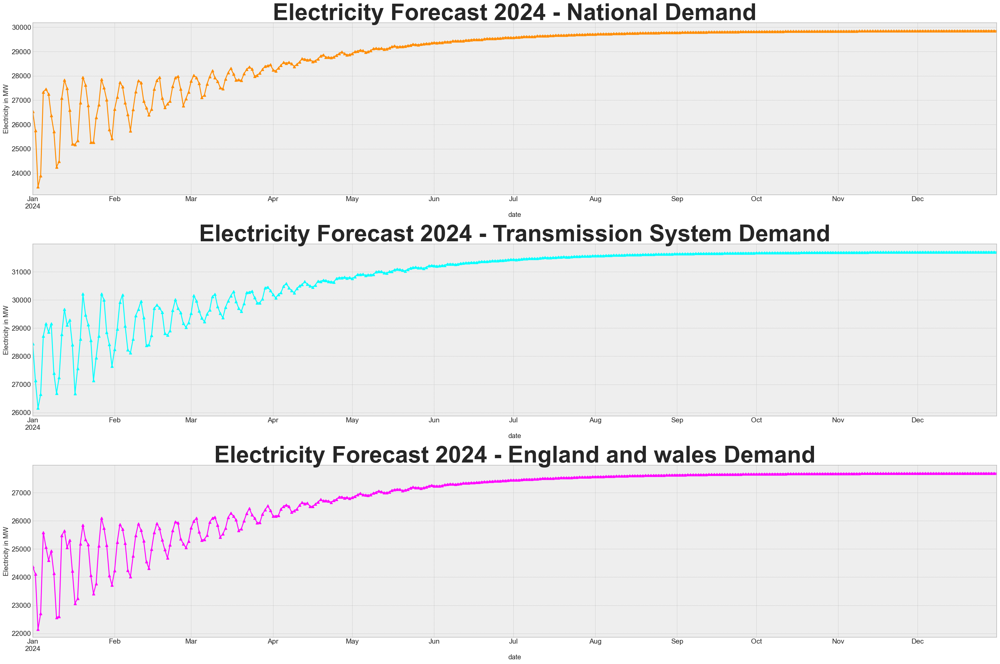

In [ ]:
f_2024(gruforecast)

# HYBRID MODELS

In [ ]:
from keras.layers import  Conv1D, MaxPooling1D, Flatten

# A) CONVOLUTION + LSTM+ DNN MODEL

In [ ]:
cld=tf.keras.Sequential([Conv1D(filters=32,kernel_size=3,strides=1,padding='causal',activation='relu',
                               input_shape=(xtrain_combined.shape[1], xtrain_combined.shape[2])),
                         
                         Conv1D(filters=64,kernel_size=3,strides=1,padding='causal',activation='relu'),
                         
                         Conv1D(filters=128,kernel_size=3,padding='causal',activation='relu'),
                         
                         MaxPooling1D(pool_size=2,strides=1,padding='same'),
                         
                         Bidirectional(LSTM(units=120,activation='relu',return_sequences=True)),
                         
                         Bidirectional(LSTM(units=120,activation='relu',return_sequences=True)),
                         
                         Bidirectional(LSTM(units=120,activation='relu',return_sequences=True)),
                         
                         Bidirectional(LSTM(units=100,activation='relu',return_sequences=True)),
                         
                         LSTM(units=100,activation='relu',return_sequences=False),
                         
                         Dense(units=84,activation='relu'),
                         
                         Dense(units=77,activation='relu'),
                         
                         Dense(units=44,activation='relu'),
                         
                         Dense(units=22,activation='relu'),
                         
                         Dense(units=9,activation='relu'),
                         
                         Dense(units=num_features, activation='linear', name=f'Final_layer_with_{num_features}_output')   
    
])

In [ ]:
cld.summary()

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d (Conv1D)                 │ (None, 12, 32)         │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 12, 64)         │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 12, 128)        │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d (MaxPooling1D)    │ (None, 12, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_19                │ (None, 12, 240)        │       239,040 │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_20                │ (None, 12, 240)        │       346,560 │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_21                │ (None, 12, 240)        │       346,560 │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_22                │ (None, 12, 200)        │       272,800 │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_4 (LSTM)                   │ (None, 100)            │       120,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 84)             │         8,484 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 77)             │         6,545 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 44)             │         3,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 22)             │           990 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 9)              │           207 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Final_layer_with_3_output       │ (None, 3)              │            30 │
│ (Dense)                         │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,376,280 (5.25 MB)

 Trainable params: 1,376,280 (5.25 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 0.1557 - mae: 0.5158 - learning_rate: 3.0000e-04
Epoch 2/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0226 - mae: 0.1777 - learning_rate: 3.0000e-04
Epoch 3/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0134 - mae: 0.1288 - learning_rate: 3.0000e-04
Epoch 4/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0137 - mae: 0.1272 - learning_rate: 3.0000e-04
Epoch 5/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0088 - mae: 0.1074 - learning_rate: 3.0000e-04
Epoch 6/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0134 - mae: 0.1269 - learning_rate: 3.0000e-04
Epoch 7/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0063 - mae: 0.0897 - learning_rate: 3.0000e-04
Epoch 8/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0150 - mae: 0.1346 - learning_rate: 3.0000e-04
Epoch 9/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0081 - mae: 0.1017 - learning_rate: 3.0000e-04
Epoch 10/50
200/200 ━━━━━━━━━━

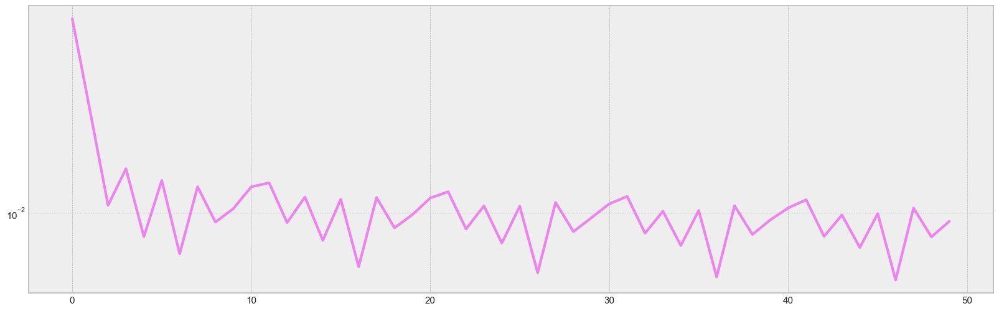

In [ ]:
# Example Model Definition
import tensorflow as tf
from tensorflow.keras.layers import Dense, SimpleRNN
from tensorflow.keras.models import Sequential

# Define the model
model = Sequential([
    SimpleRNN(units=100, activation='tanh', return_sequences=True, input_shape=(xtrain_combined.shape[1], xtrain_combined.shape[2])),
    Dense(units=50, activation='relu'),
    Dense(units=25, activation='relu'),
    Dense(units=1, activation='linear')
])

# Compile the model
optimizer = tf.keras.optimizers.Adagrad(learning_rate=1e-4)
model.compile(optimizer=optimizer, loss=tf.keras.losses.Huber(), metrics=['mae'])

# Define epochs
epochs = 50  # Replace with your desired number of epochs

# Now you can fit the model
history = model.fit(
    xtrain_combined, y=[ytrain_nd, ytrain_tsd, ytrain_ewd],
    shuffle=False, batch_size=1, epochs=epochs, callbacks=[lr_sched], steps_per_epoch=200
)

# Plotting the training history
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 6))
plt.semilogy(history.history['loss'], linewidth=3, color='violet')
plt.show()


* optimal learning rate based on the model will be less than 1e-5.

16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


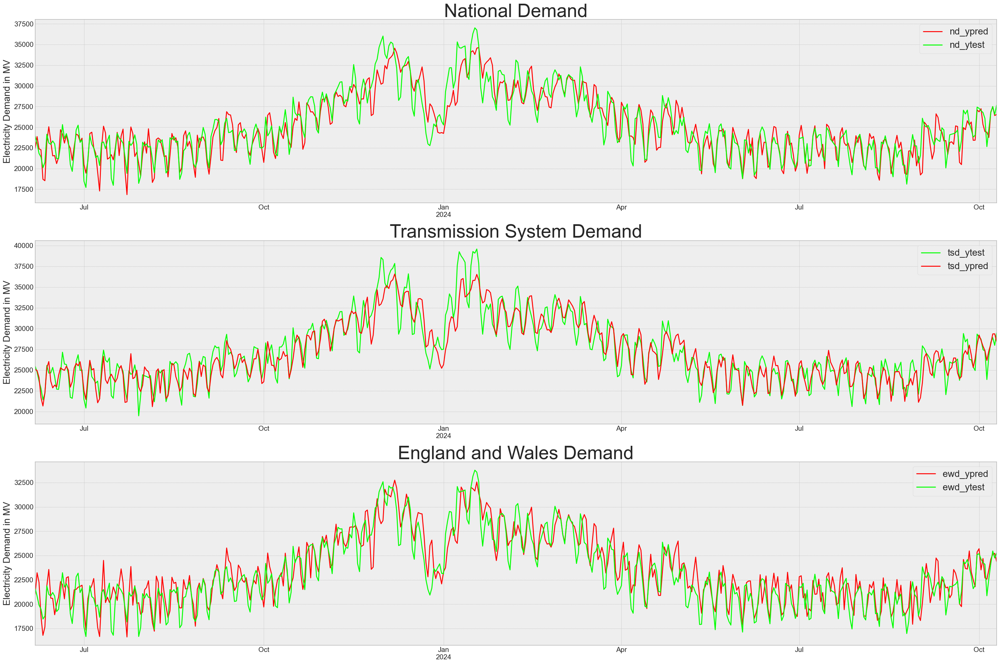

In [ ]:
cld=tf.keras.models.load_model("savebestonlymodel.keras")
cldframe,cld_metrics=predict_withplot(cld,xtest_combined) 

In [ ]:
cld_metrics

,National Demand,Transmission System Demand,England and Wales Demand
Mean Squared Error,3034133.0,2656393.0,2600271.0
Squared Root (mse),1742.0,1630.0,1613.0
Mean Absolute Error,1345.0,1243.0,1262.0
Mean Absolute Percentage Error,0.0,0.0,0.0


In [ ]:
cldforecast=forecasts(cld,366)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━

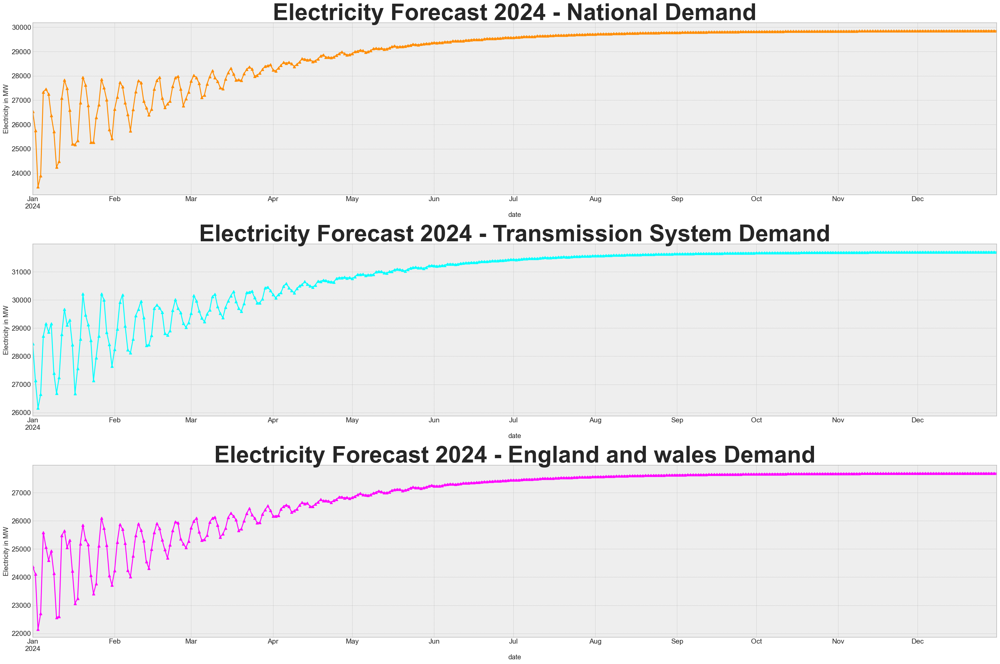

In [ ]:
f_2024(cldforecast)

# B) CONVOLUTION + GRU + DNN MODEL

In [ ]:

cgd=tf.keras.Sequential([Conv1D(filters=32,kernel_size=3,strides=1,padding='causal',activation='relu',
                               input_shape=(xtrain_combined.shape[1], xtrain_combined.shape[2])),
                         
                         Conv1D(filters=64,kernel_size=3,strides=1,padding='causal',activation='relu'),
                         
                         Conv1D(filters=128,kernel_size=3,padding='causal',activation='relu'),
                         
                         MaxPooling1D(pool_size=2,strides=1,padding='same'),
                         
                         Bidirectional(GRU(units=120,activation='relu',return_sequences=True)),
                         
                         Bidirectional(GRU(units=120,activation='relu',return_sequences=True)),
                         
                         Bidirectional(GRU(units=120,activation='relu',return_sequences=True)),
                         
                         Bidirectional(GRU(units=100,activation='relu',return_sequences=True)),
                         
                         LSTM(units=100,activation='relu',return_sequences=False),
                         
                         Dense(units=84,activation='relu'),
                         
                         Dense(units=77,activation='relu'),
                         
                         Dense(units=44,activation='relu'),
                         
                         Dense(units=22,activation='relu'),
                         
                         Dense(units=9,activation='relu'),
                         
                         Dense(units=num_features, activation='linear', name=f'Final_layer_with_{num_features}_output')   
])

In [ ]:
cgd.summary()

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_3 (Conv1D)               │ (None, 12, 32)         │           320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_4 (Conv1D)               │ (None, 12, 64)         │         6,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_5 (Conv1D)               │ (None, 12, 128)        │        24,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_1 (MaxPooling1D)  │ (None, 12, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_23                │ (None, 12, 240)        │       180,000 │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_24                │ (None, 12, 240)        │       260,640 │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_25                │ (None, 12, 240)        │       260,640 │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ bidirectional_26                │ (None, 12, 200)        │       205,200 │
│ (Bidirectional)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_5 (LSTM)                   │ (None, 100)            │       120,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 84)             │         8,484 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 77)             │         6,545 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 44)             │         3,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 22)             │           990 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 9)              │           207 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ Final_layer_with_3_output       │ (None, 3)              │            30 │
│ (Dense)                         │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,077,800 (4.11 MB)

 Trainable params: 1,077,800 (4.11 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50


200/200 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - loss: 0.0101 - mae: 0.1144 - learning_rate: 3.0000e-04
Epoch 2/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0065 - mae: 0.0907 - learning_rate: 3.0000e-04
Epoch 3/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0075 - mae: 0.0976 - learning_rate: 3.0000e-04
Epoch 4/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0068 - mae: 0.0950 - learning_rate: 3.0000e-04
Epoch 5/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0077 - mae: 0.0991 - learning_rate: 3.0000e-04
Epoch 6/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0074 - mae: 0.0976 - learning_rate: 3.0000e-04
Epoch 7/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0042 - mae: 0.0724 - learning_rate: 3.0000e-04
Epoch 8/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 0.0097 - mae: 0.1100 - learning_rate: 3.0000e-04
Epoch 9/50
200/200 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - loss: 0.0066 - mae: 0.0888 - learning_rate: 3.0000e-04
Epoch 10/50
200/200 ━━━━━━━━━━

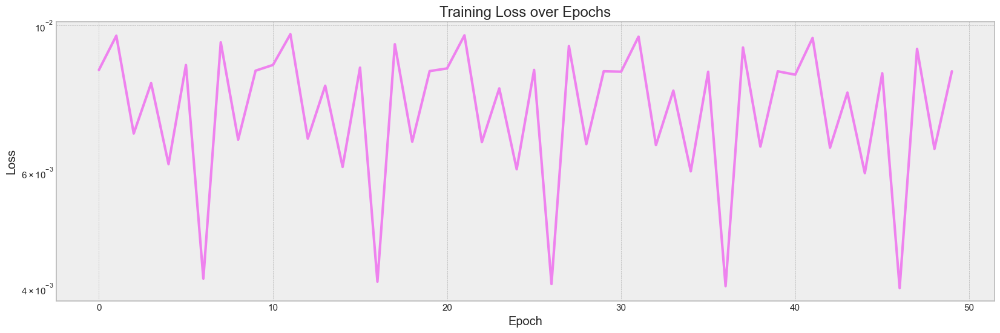

In [ ]:
opt2 = tf.keras.optimizers.Adagrad()
model.compile(optimizer=opt2, loss=tf.keras.losses.Huber())

# Fit the model (without use_multiprocessing)
history = model.fit(
    xtrain_combined, y=[ytrain_nd, ytrain_tsd, ytrain_ewd], 
    shuffle=False, batch_size=1, epochs=epoch, callbacks=[lr_sched], steps_per_epoch=200
)

# Plot the training history (loss over epochs)
plt.figure(figsize=(20, 6))
plt.semilogy(history.history['loss'], linewidth=3, color='violet')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss over Epochs')
plt.show()


16/16 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step


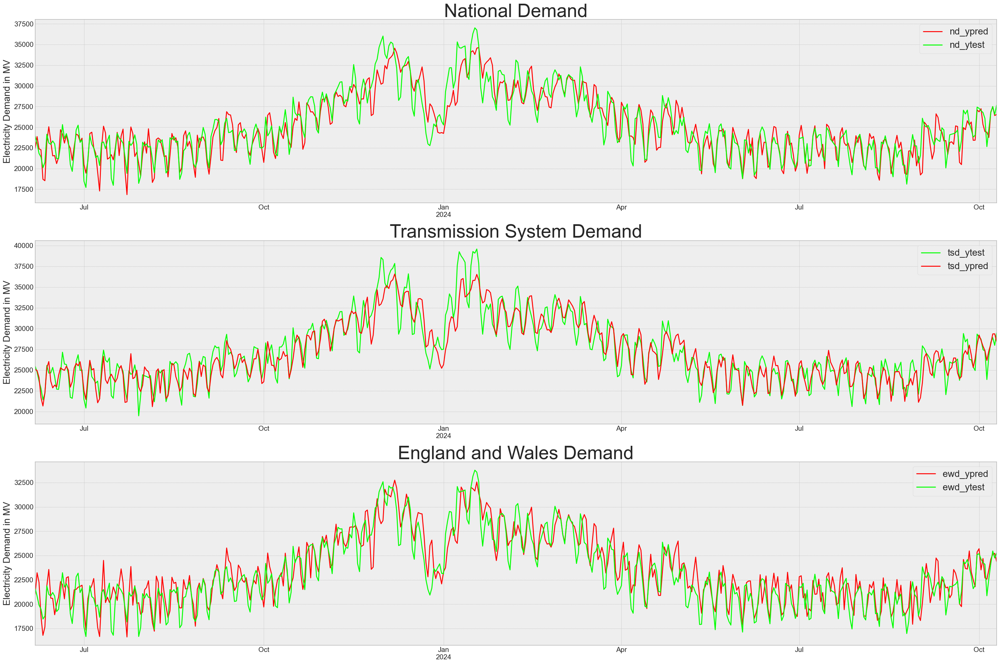

In [ ]:
cgd=tf.keras.models.load_model("savebestonlymodel.keras")
cgdframe,cgd_metrics=predict_withplot(cgd,xtest_combined) 

In [ ]:
cgd_metrics

,National Demand,Transmission System Demand,England and Wales Demand
Mean Squared Error,3034133.0,2656393.0,2600271.0
Squared Root (mse),1742.0,1630.0,1613.0
Mean Absolute Error,1345.0,1243.0,1262.0
Mean Absolute Percentage Error,0.0,0.0,0.0


In [ ]:
cgdforecast=forecasts(cgd,366)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 9ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━

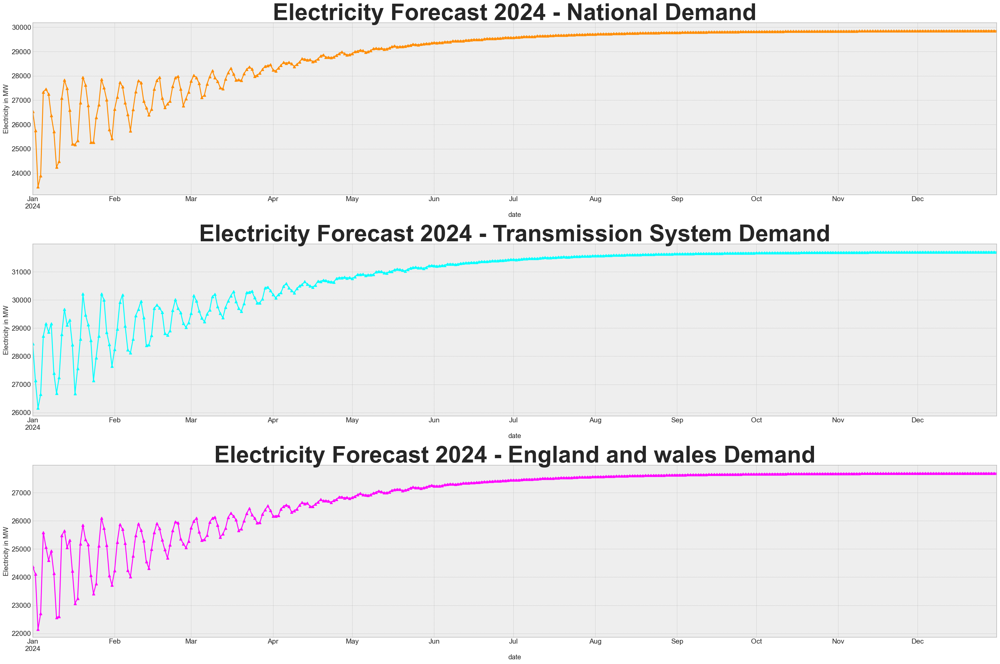

In [ ]:
f_2024(cgdforecast)